In [1]:
import pandas as pd
# import numpy as np
import seaborn as sns
# import scipy
from matplotlib import pyplot as plt

In [9]:
edu_spending_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=0"
arts_edu_policies_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=1397950742"
sp_g4_math_2019_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=1999542441"
sp_g8_math_2019_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=456758856"
sp_g4_reading_2019_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=1273736783"
sp_g8_reading_2019_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=960745170"

arts_edu_policies_2021_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=496847001"
happiness_datapath = "https://docs.google.com/spreadsheets/d/1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18/export?format=csv&id=1BkXJjCqXiWi_ysFu2Jcnqbo0otuC-BwLhfqJNl1Fx18&gid=937005672"

In [19]:
# use second row as header
# use first column of state names to index data instead of arbitrary 0..50 numbers
# use all columns except the last "Link" column
edu_spending_data = pd.read_csv(edu_spending_datapath, index_col=0)
arts_edu_policies_data = pd.read_csv(arts_edu_policies_datapath, index_col=0)
sp_g4_math_2019_data = pd.read_csv(sp_g4_math_2019_datapath, index_col=0)
sp_g4_reading_2019_data = pd.read_csv(sp_g4_reading_2019_datapath, index_col=0)
sp_g8_math_2019_data = pd.read_csv(sp_g8_math_2019_datapath, index_col=0)
sp_g8_reading_2019_data = pd.read_csv(sp_g8_reading_2019_datapath, index_col=0)
arts_edu_policies_2021_data = pd.read_csv(arts_edu_policies_2021_datapath, index_col=0)
happiness_data = pd.read_csv(happiness_datapath, index_col=0)

# add prefixes to differentiate score columns
sp_g4_math_2019_data = sp_g4_math_2019_data.add_prefix("g4_math_2019 - ")
sp_g4_reading_2019_data = sp_g4_reading_2019_data.add_prefix("g4_reading_2019 - ")
sp_g8_math_2019_data = sp_g8_math_2019_data.add_prefix("g8_math_2019 - ")
sp_g8_reading_2019_data = sp_g8_reading_2019_data.add_prefix("g8_reading_2019 - ")

In [18]:
arts_edu_policies_2021_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51 entries, Alabama to Wyoming
Data columns (total 15 columns):
 #   Column                                               Non-Null Count  Dtype
---  ------                                               --------------  -----
 0   Arts as a Core Academic Subject                      51 non-null     bool 
 1   Early Childhood Arts Ed Standards                    51 non-null     bool 
 2   Elementary & Secondary Arts Ed Standards             51 non-null     bool 
 3   Arts Ed Instructional Requirement Elementary School  51 non-null     bool 
 4   Arts Ed Instructional Requirement Middle School      51 non-null     bool 
 5   Arts Ed Instructional Requirement High School        51 non-null     bool 
 6   Arts Requirements for High School Graduation         51 non-null     bool 
 7   Arts Alternatives for High School Graduation         51 non-null     bool 
 8   Arts Ed Assessment Requirements                      51 non-null     bool 
 9   Arts E

In [42]:
data = pd.concat(
    [
        edu_spending_data,
        arts_edu_policies_data,
        sp_g4_math_2019_data,
        sp_g4_reading_2019_data,
        sp_g8_math_2019_data,
        sp_g8_reading_2019_data,
        arts_edu_policies_2021_data,
        happiness_data
    ],
    axis=1)

data = data[data.columns.drop(list(data.filter(regex='SigSymbol')))] # drop all columns containing SigSymbol

data = data.dropna() # drop all null rows (National average, Puerto Rico, etc.)

# convert currency values to integers
data['Spending Per Pupil'] = data['Spending Per Pupil'].str.replace('[$,]', '', regex=True).astype('int')
data['Funding Per Pupil'] = data['Funding Per Pupil'].str.replace('[$,]', '', regex=True).astype('int')
data['Differential'] = data['Differential'].str.replace('[$,]', '', regex=True).astype('int')

# convert T/F to boolean number 0/1
data = data.applymap(lambda x: 1 if x==True else (0 if x==False else x))

# replace Yes and No with 1 and 0
data = data.replace(to_replace = ['Yes','No'],value = [1, 0])

# replace '#' sign (signifies a 0 change from national average from source dataset) into a 0 integer
data = data.replace(to_replace = '#',value = 0)

for col in data.columns: # convert all data from strings to integers
    data[col] = pd.to_numeric(data[col])

# data

In [41]:
pd.options.display.max_columns = None
corr = data.corr()
corr

,Spending Per Pupil,Funding Per Pupil,Differential,State defines the arts in statute or code as a core or academic subject,State adopted early childhood or prekindergarten arts education standards,State adopted elementary and/or secondary arts education standards,State requires districts or schools to offer arts instruction at the elementary school level,State requires districts or schools to offer arts instruction at the middle school level,State requires districts or schools to offer arts instruction at the high school level,State includes arts courses as an option to fulfill graduation requirements,"State requires state-, district- or school-level assessment of student learning in the arts",State specifies arts education as a requirement for schools to be accredited,State provides funding for an arts education grant program or a state-funded school for the arts,g4_math_2019 - Score (MN),g4_math_2019 - Difference from National Public (NP) (SigDiff),g4_math_2019 - At or Above Basic (AB),g4_math_2019 - At or Above Proficient (AP),g4_reading_2019 - Score (MN),g4_reading_2019 - Difference from National Public (NP) (SigDiff),g4_reading_2019 - At or Above Basic (AB),g4_reading_2019 - At or Above Proficient (AP),g8_math_2019 - Score (MN),g8_math_2019 - Difference from National Public (NP) (SigDiff),g8_math_2019 - At or Above Basic (AB),g8_math_2019 - At or Above Proficient (AP),g8_reading_2019 - Score (MN),g8_reading_2019 - Difference from National Public (NP) (SigDiff),g8_reading_2019 - At or Above Basic (AB),g8_reading_2019 - At or Above Proficient (AP),Arts as a Core Academic Subject,Early Childhood Arts Ed Standards,Elementary & Secondary Arts Ed Standards,Arts Ed Instructional Requirement Elementary School,Arts Ed Instructional Requirement Middle School,Arts Ed Instructional Requirement High School,Arts Requirements for High School Graduation,Arts Alternatives for High School Graduation,Arts Ed Assessment Requirements,Arts Ed Requirements for State Accredidation,Licensure Requirements for Non-Arts Teachers,Licensure Requirements for Arts Teachers,State Arts Ed Grant Program or School for Arts,Arts and STEAM Diploma Seals,Other State Arts Ed Policies,Total Score,‘Emotional & Physical Well-Being’ Rank,‘Work Environment’ Rank,‘Community & Environment’ Rank
Spending Per Pupil,1.000000,0.989587,0.636937,-0.062133,NaN,NaN,-0.051977,-0.051977,0.037770,-0.059838,0.226100,-0.090804,-0.160068,0.150898,0.150898,0.084830,0.202668,0.222712,0.226724,0.217242,0.322096,0.306867,0.305355,0.236398,0.383311,0.359325,0.359325,0.238484,0.405976,0.108612,NaN,NaN,0.051167,0.068118,0.086427,0.086219,-0.146830,0.226552,-0.090804,-0.007727,-0.035354,-0.198090,-0.288077,-0.158983,0.276802,-0.457730,0.171450,0.171114
Funding Per Pupil,0.989587,1.000000,0.741269,-0.046063,NaN,NaN,-0.056445,-0.056445,0.042156,-0.060384,0.242796,-0.066726,-0.169449,0.166621,0.166621,0.079425,0.220791,0.241658,0.244239,0.225153,0.337590,0.316574,0.314835,0.233940,0.393622,0.369324,0.369324,0.245048,0.413015,0.111816,NaN,NaN,0.052075,0.071060,0.098726,0.049733,-0.162903,0.212496,-0.066726,-0.015814,-0.026303,-0.205423,-0.289651,-0.133513,0.307015,-0.481981,0.158317,0.154144
Differential,0.636937,0.741269,1.000000,0.043136,NaN,NaN,-0.059844,-0.059844,0.049599,-0.044259,0.246196,0.065980,-0.161127,0.188862,0.188862,0.029919,0.237548,0.255754,0.250866,0.192854,0.306109,0.264570,0.262310,0.150599,0.320736,0.302399,0.302399,0.200298,0.318846,0.092498,NaN,NaN,0.040334,0.062972,0.125622,-0.135713,-0.187647,0.081617,0.065980,-0.048731,0.023870,-0.176394,-0.208008,0.026301,0.353539,-0.446956,0.048484,0.027728
State defines the arts in statute or code as a core or academic subject,-0.062133,-0.046063,0.043136,1.000000,NaN,NaN,0.184553,0.184553,0.184553,0.033086,0.149414,0.097518,0.182860,0.182905,0.182905,0.120801,0.142511,0.107023,0.112751,0.074096,0.092938,0.131982,0.135062,0.065888,0.111408,0.059623,0.059623,0.042805,0.072173,0.881354,NaN,NaN,0.070741,0.070741,0.240572,-0.134966,0.0

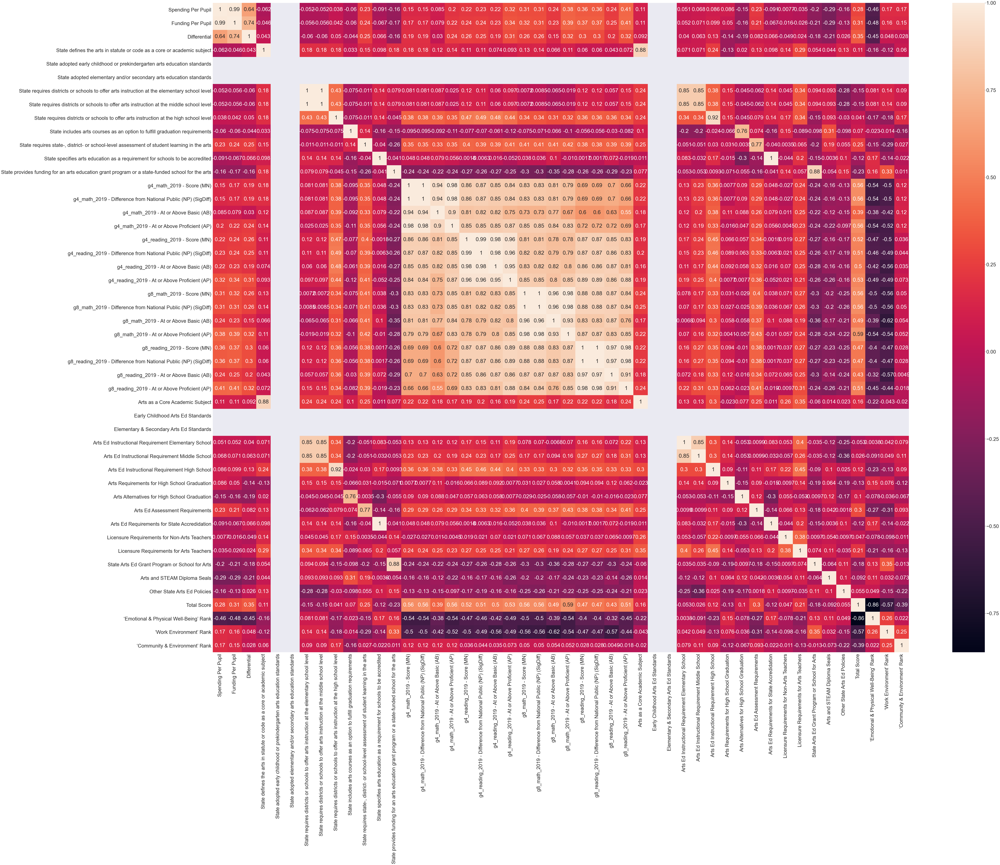

In [43]:
plt.figure(figsize=(100, 80))
sns.set(font_scale = 3)
sns.heatmap(corr, annot=True)
plt.tight_layout()
plt.savefig('correlations.png')
plt.show()

In [44]:
# g= sns.pairplot(df,hue = 'target', diag_kind= 'hist',
#              vars=df.columns[:-1],
#              plot_kws=dict(alpha=0.5), 
#              diag_kws=dict(alpha=0.5))
# plt.show()
# plt.figure(figsize=(80, 80))
pairplot = sns.pairplot(data, vars=data.columns[:-1], height=5)
pairplot.set(xticklabels=[])
pairplot.set(yticklabels=[])
for ax in pairplot.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')

plt.tight_layout()
plt.savefig('pairplot.png')
plt.show()

In [80]:
# plt.scatter(df.iloc[:,0], df.iloc[:,1])
# plt.show()

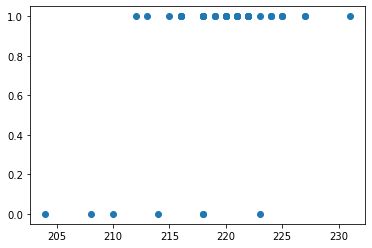

In [8]:
# plt.scatter(df.iloc[:,1], df['art_edu_policy_col_6'])
# plt.show()

In [10]:
# df.corr(method='kendall')

,scores_grade4_math,scores_grade4_reading,spending,art_edu_policy_col_1,art_edu_policy_col_2,art_edu_policy_col_3,art_edu_policy_col_4,art_edu_policy_col_5,art_edu_policy_col_6,art_edu_policy_col_7,art_edu_policy_col_8,art_edu_policy_col_9,art_edu_policy_col_10
scores_grade4_math,1.000000,0.759131,0.070332,0.189559,NaN,NaN,0.106828,0.106828,0.312267,-0.093829,0.296183,0.087580,-0.173573
scores_grade4_reading,0.759131,1.000000,0.144112,0.096607,NaN,NaN,0.089384,0.089384,0.316154,-0.094500,0.354768,-0.016916,-0.161012
spending,0.070332,0.144112,1.000000,-0.018864,NaN,NaN,-0.140538,-0.140538,-0.047911,-0.023638,0.187132,-0.044300,-0.227473
art_edu_policy_col_1,0.189559,0.096607,-0.018864,1.000000,NaN,NaN,0.227843,0.227843,0.227843,0.050880,0.162281,0.111979,0.199060
art_edu_policy_col_2,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
art_edu_policy_col_3,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
art_edu_policy_col_4,0.106828,0.089384,-0.140538,0.227843,NaN,NaN,1.000000,1.000000,0.503247,-0.029749,0.024079,0.161165,0.117305
art_edu_policy_col_5,0.106828,0.089384,-0.140538,0.227843,NaN,NaN,1.000000,1.000000,0.503247,-0.029749,0.024079,0.161165,0.117305
art_edu_policy_col_6,0.312267,0.316154,-0.047911,0.227843,NaN,NaN,0.503247,0.503247,1.000000,-0.029749,0.024079,0.161165,0.002256
art_edu_policy_col_7,-0.093829,-0.094500,-0.023638,0.050880,NaN,NaN,-0.029749,-0.029749,-0.029749,1.000000,0.149346,-0.141990,-0.131969


In [11]:
# scipy.stats.pearsonr(df['scores_grade4_math'], df['art_edu_policy_col_6'])

(0.3997508453444213, 0.0036577748170924817)

In [12]:
# scipy.stats.spearmanr(df['scores_grade4_math'], df['art_edu_policy_col_6'])

SpearmanrResult(correlation=0.3690460321657876, pvalue=0.007699508373229228)

In [13]:
# scipy.stats.kendalltau(df['scores_grade4_math'], df['art_edu_policy_col_6'])

KendalltauResult(correlation=0.31226694099082475, pvalue=0.009066152336241801)